Zomato Restaurant

Project Description:-

Zomato Data Analysis is one of the most useful analysis for foodies who want to taste the best
cuisines of every part of the world which lies in their budget. This analysis is also for those who
want to find the value for money restaurants in various parts of the country for the cuisines.
Additionally, this analysis caters the needs of people who are striving to get the best cuisine of
the country and which locality of that country serves that cuisines with maximum number of
restaurants.

Data Storage: This problem statement contains two datasets- Zomato.csv and country_code.csv.
Country_code.csv contains two variables:
• Country code  • Country name

Problem statement : In this dataset predict 2 things –
1) Average Cost for two
2) Price range

Dataset Link-
https://github.com/dsrscientist/dataset4/blob/main/Country-Code.xlsx
https://github.com/dsrscientist/dataset4/blob/main/zomato.csv

In [1]:
# Importing neccessary librarys
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt 
import warnings 
warnings.filterwarnings('ignore')

In [230]:
# Try reading the file with different encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        df1 = pd.read_csv(r'C:\Users\ganes\Downloads\dataset4-main\zomato.csv', encoding=encoding)
        break  # If successful, break the loop
    except UnicodeDecodeError:
        continue

df1.head()


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [231]:
df2= pd.read_excel(r"C:\Users\ganes\Downloads\dataset4-main\Country-Code.xlsx")
df2.head()

,Country Code,Country
0,1,India
1,14,Australia
2,30,Brazil
3,37,Canada
4,94,Indonesia


In [175]:
# Merge the dataframes using the "Country Code" column
df = df1.merge(df2, on='Country Code', how='inner')

In [99]:
# Data type of columns 
df.dtypes

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
Country                  object
dtype: object

In [6]:
# For checking dataset diemensions 
df.shape 

(9551, 22)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9551 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [8]:
# Summarizing the distribution of the numerical variables.
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


Checking for missing value

In [9]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
Country                 0
dtype: int64

'Cuisines' column contain 9 Null value.

In [176]:
df['Cuisines'].fillna('Unknown', inplace=True)

Check Unique value for labeled columns.

In [11]:
df['Average Cost for two'].nunique()

140

Labeled column contain 140 unique value. we can categorize as regression problem.

In [12]:
df['Price range'].nunique()

4

Labeled column contain 4 unique value. we can categorize as Classification problem.

Value count of columns

In [13]:
df['Average Cost for two'].value_counts()

500       900
300       897
400       857
200       687
600       652
         ... 
8000        1
2350        1
150000      1
70000       1
545         1
Name: Average Cost for two, Length: 140, dtype: int64

In [14]:
df['Price range'].value_counts()

1    4444
2    3113
3    1408
4     586
Name: Price range, dtype: int64

In [15]:
df['Switch to order menu'].value_counts()

No    9551
Name: Switch to order menu, dtype: int64

In [177]:
# 'Switch to order menu' column contain same variable.So we drop column. 
df.drop('Switch to order menu', axis=1, inplace=True)

In [102]:
df['Cuisines'].value_counts()

North Indian                                             936
North Indian, Chinese                                    511
Fast Food                                                354
Chinese                                                  354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: Cuisines, Length: 1826, dtype: int64

In [103]:
df['Restaurant ID'].value_counts()

6317637     1
18254520    1
18462589    1
18336474    1
18336477    1
           ..
313059      1
763         1
7557        1
525         1
5927402     1
Name: Restaurant ID, Length: 9551, dtype: int64

In [178]:
# All Restaurant ID is unique in column.
df.drop(columns=['Restaurant ID'], inplace=True)

In [105]:
df['Rating text'].value_counts()

Average      3737
Not rated    2148
Good         2100
Very Good    1079
Excellent     301
Poor          186
Name: Rating text, dtype: int64

In [106]:
df['Restaurant Name'].value_counts()

Cafe Coffee Day             83
Domino's Pizza              79
Subway                      63
Green Chick Chop            51
McDonald's                  48
                            ..
Odeon Social                 1
Johnny Rockets               1
House of Commons             1
HotMess                      1
Walter's Coffee Roastery     1
Name: Restaurant Name, Length: 7446, dtype: int64

In [179]:
# More number of  Restaurant Name is unique in column.
df.drop(columns=['Restaurant Name'], inplace=True)

In [108]:
df['City'].value_counts()

New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
                ... 
Huskisson          1
Panchkula          1
Forrest            1
Flaxton            1
Chatham-Kent       1
Name: City, Length: 141, dtype: int64

In [109]:
df['Address'].value_counts()

Sector 41, Noida                                                                         11
Dilli Haat, INA, New Delhi                                                               11
Greater Kailash (GK) 1, New Delhi                                                        10
The Imperial, Janpath, New Delhi                                                          9
Palate of Delhi, Dhaula Kuan Metro Station, Chanakyapuri, New Delhi                       8
                                                                                         ..
23-24, Defence Colony Market, Defence Colony, New Delhi                                   1
28, Main Market, Defence Colony, New Delhi                                                1
Daryaganj, New Delhi                                                                      1
Ground Floor, E-23, Netaji Subhash Marg, Opposite Golcha Cinema, Daryaganj, New Delhi     1
CafeaÛôa Mahallesi, BademaltÛ± Sokak, No 21/B, KadÛ±kí_y, ÛÁstanbul             

In [180]:
# More number of Address is unique in column.
df.drop(columns=['Address'], inplace=True)

In [111]:
df['Locality'].value_counts()

Connaught Place                                122
Rajouri Garden                                  99
Shahdara                                        87
Defence Colony                                  86
Pitampura                                       85
                                              ... 
Lemon Tree Premier, Sector 29                    1
Omaxe Celebration Mall, Sohna Road, Gurgaon      1
Park Inn, Sector 15, Gurgaon                     1
Plaza Mall, MG Road                              1
Moda                                             1
Name: Locality, Length: 1208, dtype: int64

In [181]:
# More number of Locality is unique in column.
df.drop(columns=['Locality'], inplace=True)

In [113]:
df['Locality Verbose'].value_counts()

Connaught Place, New Delhi                    122
Rajouri Garden, New Delhi                      99
Shahdara, New Delhi                            87
Defence Colony, New Delhi                      86
Pitampura, New Delhi                           85
                                             ... 
Ramada Gurgaon Central, Sector 44, Gurgaon      1
Sector 5, Gurgaon                               1
Sector 53, Gurgaon                              1
The Claremont, MG Road, Gurgaon                 1
Moda, ÛÁstanbul                                 1
Name: Locality Verbose, Length: 1265, dtype: int64

In [182]:
# More number of Locality Verbose is unique in column.
df.drop(columns=['Locality Verbose'], inplace=True)

In [115]:
df['Cuisines'].value_counts()

North Indian                                             936
North Indian, Chinese                                    511
Fast Food                                                354
Chinese                                                  354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: Cuisines, Length: 1826, dtype: int64

In [183]:
# More number of Cuisines is unique in column.
df.drop(columns=['Cuisines'], inplace=True)

In [117]:
df['Country'].value_counts()

India             8652
United States      434
United Kingdom      80
Brazil              60
UAE                 60
South Africa        60
New Zealand         40
Turkey              34
Australia           24
Phillipines         22
Indonesia           21
Singapore           20
Qatar               20
Sri Lanka           20
Canada               4
Name: Country, dtype: int64

Data Visualization

1.Using Univariate Plots

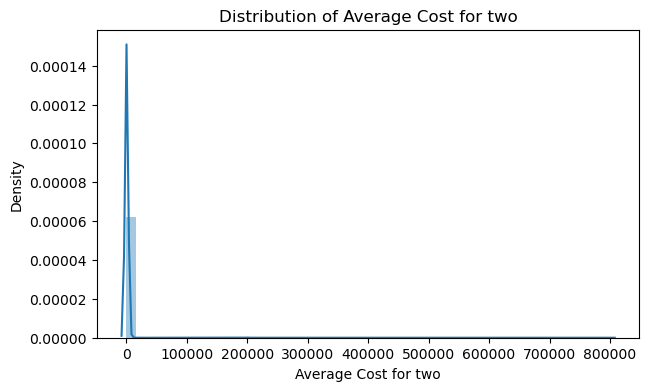

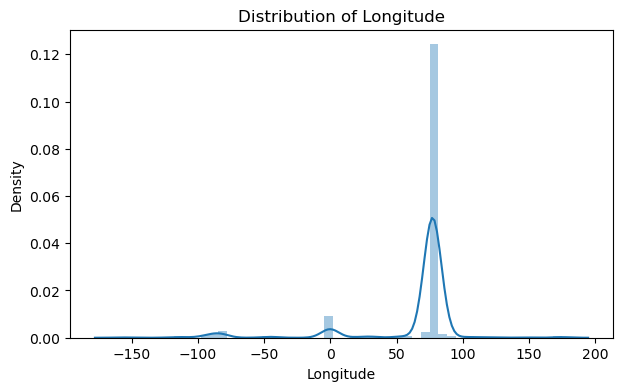

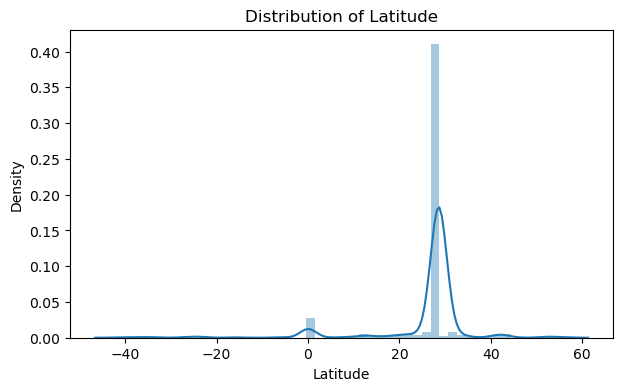

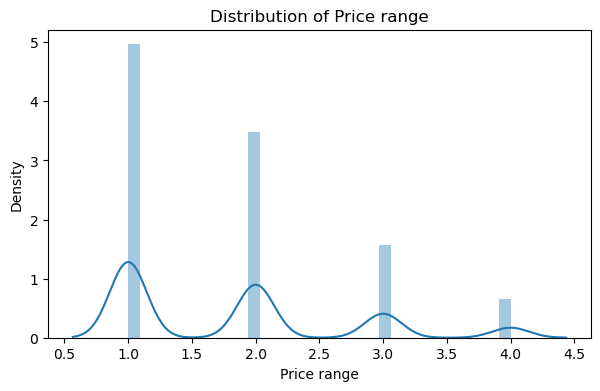

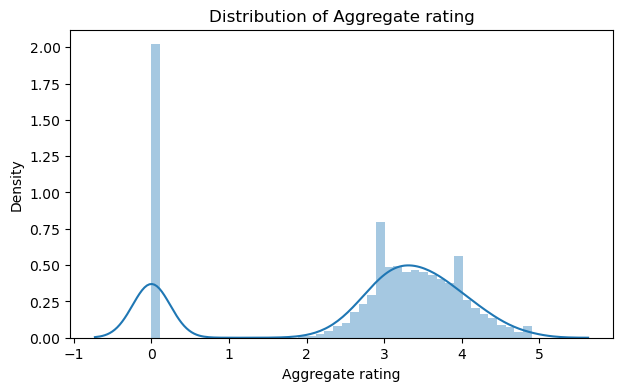

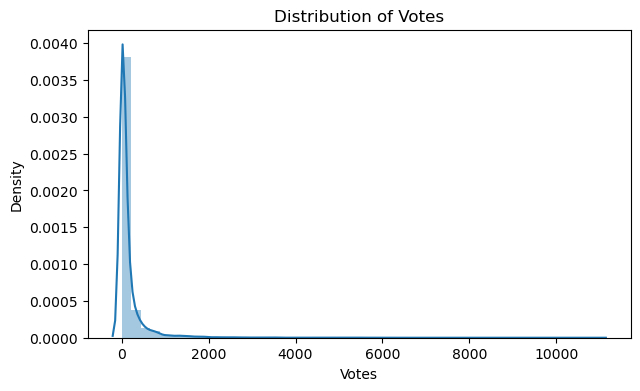

In [33]:
# List of numerical and categorical column names
numerical_cols = ['Average Cost for two', 'Longitude', 'Latitude', 'Price range', 'Aggregate rating', 'Votes']

# Plot distplots for numerical columns
for col in numerical_cols:
    plt.figure(figsize=(7, 4))
    sns.distplot(df[col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.show()

Skipping City as it has too many unique values for a count plot.
Skipping Currency as it has too many unique values for a count plot.


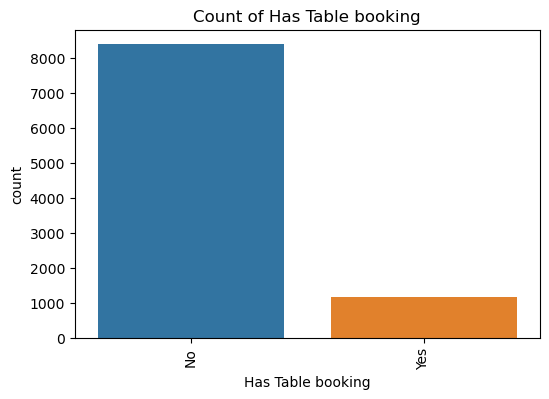

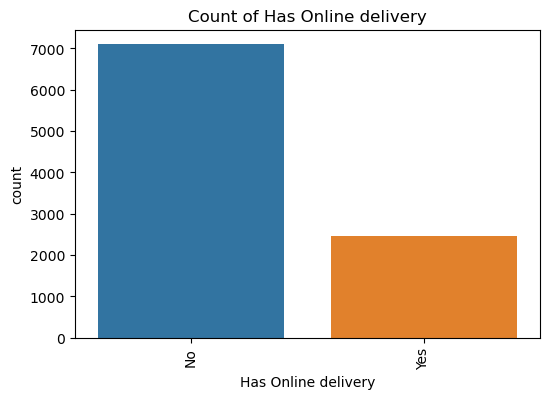

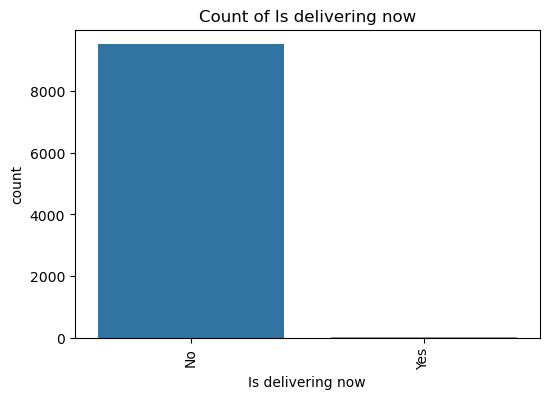

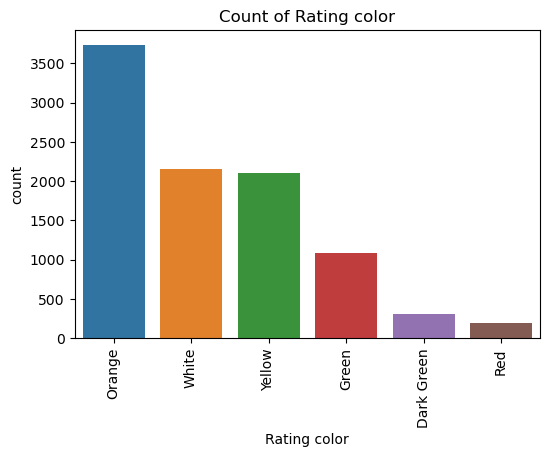

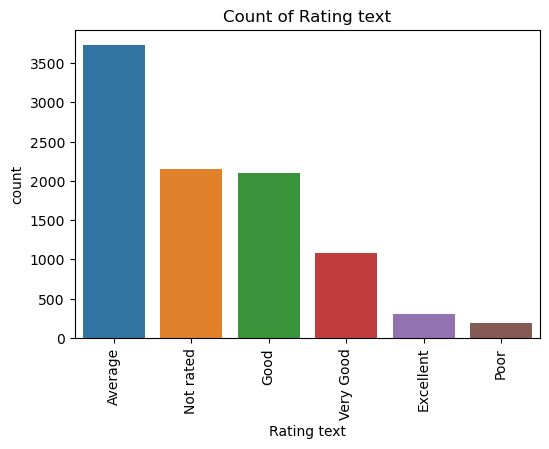

Skipping Country as it has too many unique values for a count plot.


In [34]:
categorical_cols = ['City', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Rating color', 'Rating text', 'Country']

# Plot count plots for categorical columns
for col in categorical_cols:
    if df[col].nunique() < 10:
        plt.figure(figsize=(6, 4))
        sns.countplot(data=df, x=col, order=df[col].value_counts().index)
        plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
        plt.title(f'Count of {col}')
        plt.xlabel(col)
        plt.show()
    else:
        print(f'Skipping {col} as it has too many unique values for a count plot.')

2.Using Multivariate Plots

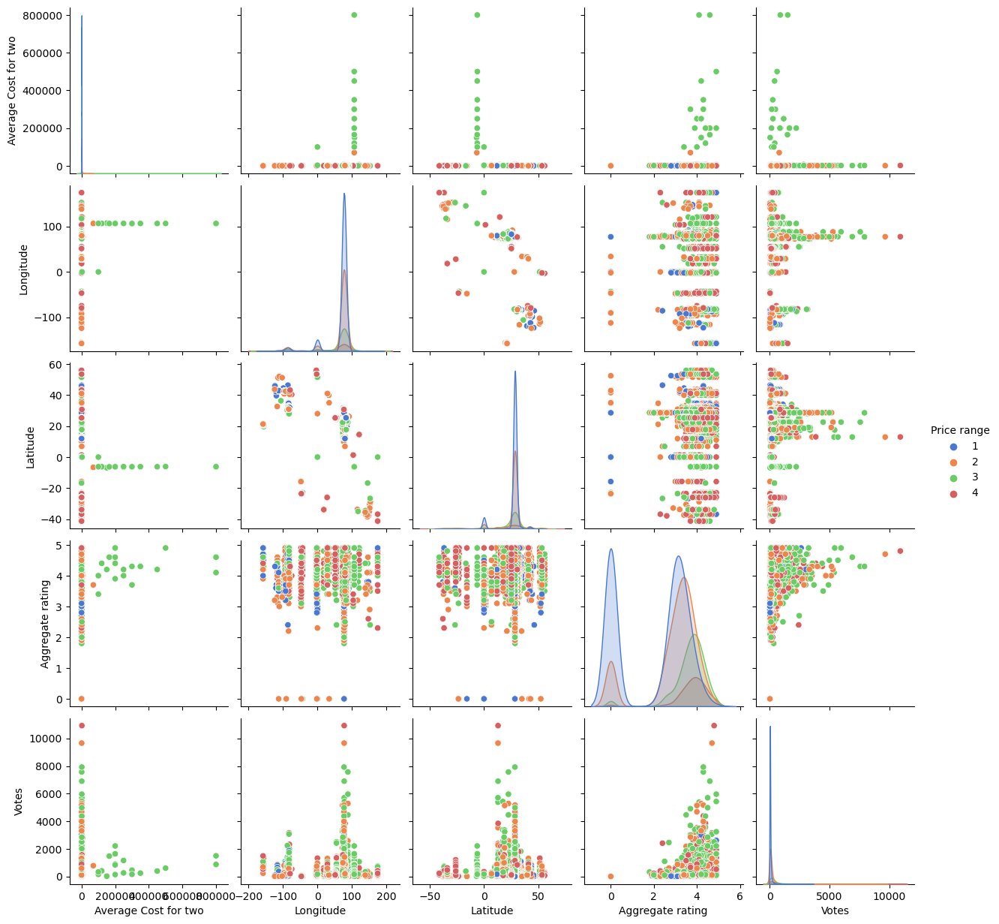

In [35]:
# Select columns for the pair plot
columns_to_include = ['Average Cost for two','Longitude', 'Latitude', 'Price range', 'Aggregate rating', 'Votes']

# Create the pair plot
sns.pairplot(df[columns_to_include], diag_kind='kde', markers='o', hue='Price range',palette='muted')
plt.show()


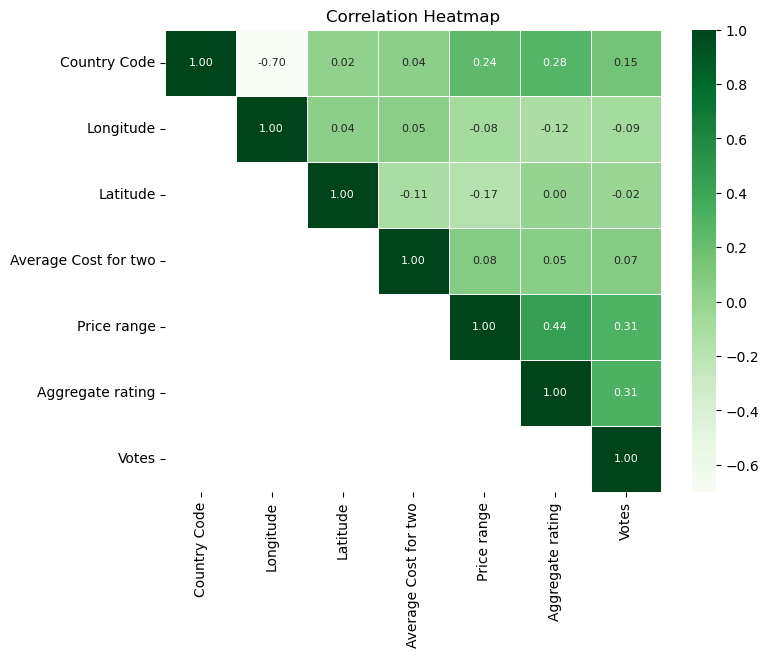

In [36]:
# Heatmap to visualize correlations between features
correlation_matrix = df.corr()

plt.figure(figsize=(8, 6))
# Create a mask to hide the lower triangle of the heatmap
mask = np.tri(*correlation_matrix.shape, k=-1, dtype=bool)

sns.heatmap(correlation_matrix, annot=True, cmap='Greens', linewidths=0.5,fmt=".2f", annot_kws={"size": 8}, mask=mask)

plt.yticks(rotation=0)   # Keep y-axis labels horizontal
plt.title('Correlation Heatmap')
plt.show()

'Country Code', 'Longitude' are highly correlated. But country code is categorical nature column.

Box-Plot

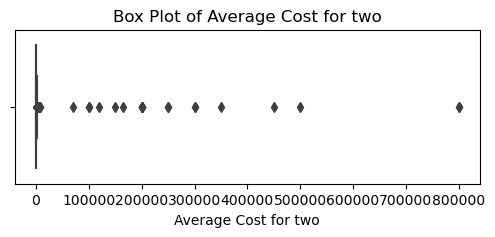

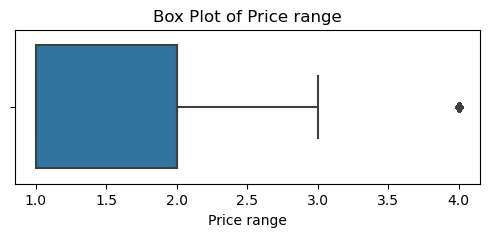

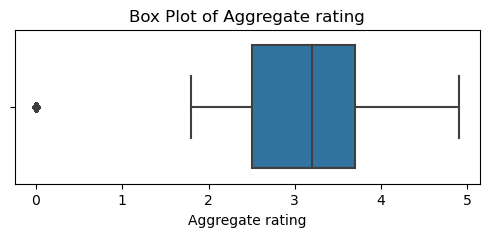

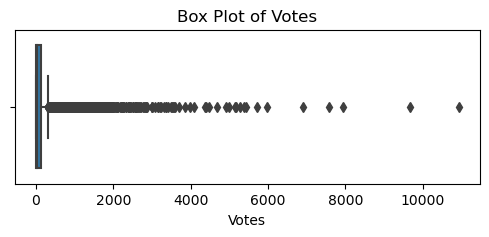

In [37]:
# List of numerical columns
numerical_cols = ['Average Cost for two', 'Price range', 'Aggregate rating', 'Votes']

# Create box plots for numerical columns
for col in numerical_cols:
    plt.figure(figsize=(6, 2))
    sns.boxplot(data=df, x=col)
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.show()


'Average Cost for two' and 'Price range' is labled column. 'Aggregate rating' and 'Votes' columns are show real scenario of feedback of customers. 

In [38]:
from sklearn.cluster import KMeans

# Extract the longitude and latitude data
data = df[['Longitude', 'Latitude']]

# Create a K-Means model with the desired number of clusters
kmeans = KMeans(n_clusters=5, random_state=39)

# Fit the model to your data
kmeans.fit(data)

# Get the cluster assignments for each data point
cluster_labels = kmeans.labels_


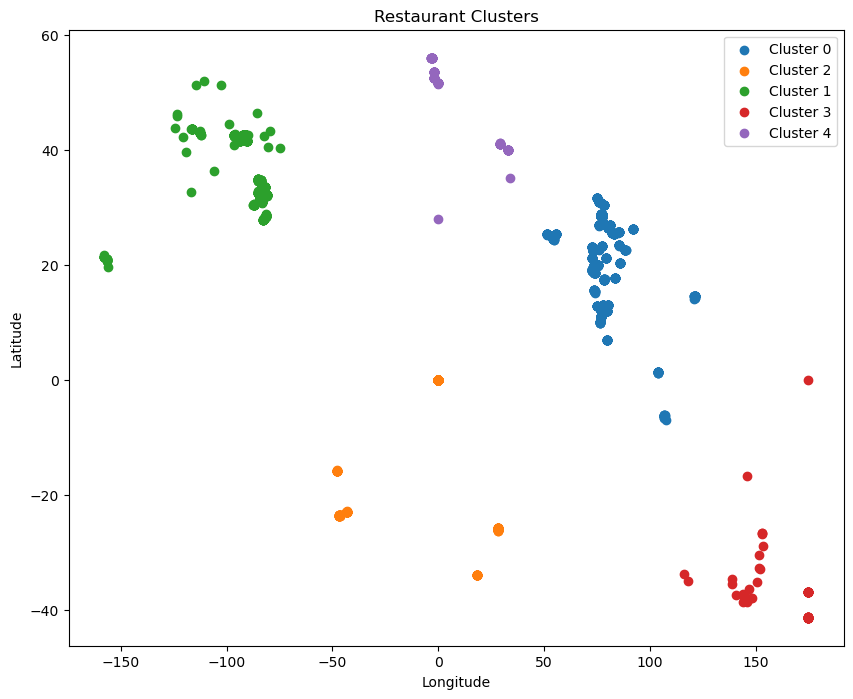

In [233]:
# Add the cluster labels to the dataframe
df['Cluster'] = cluster_labels

# Plot the clustered data points
plt.figure(figsize=(10, 8))
for cluster in df['Cluster'].unique():
    cluster_data = df[df['Cluster'] == cluster]
    plt.scatter(cluster_data['Longitude'], cluster_data['Latitude'], label=f'Cluster {cluster}')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Restaurant Clusters')
plt.legend()
plt.show()


In [235]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [237]:
import folium

# Filter out rows with latitude and longitude not equal to 0.000000
filtered_data = df[(df['Latitude'] != 0.000000) & (df['Longitude'] != 0.000000)]

# Calculate the most common non-zero latitude and longitude
center_latitude = filtered_data['Latitude'].mode().iloc[0]
center_longitude = filtered_data['Longitude'].mode().iloc[0]

# Create a map centered at the most common coordinates
m = folium.Map(location=[center_latitude, center_longitude], zoom_start=12)

# Define cluster colors for visualization
cluster_colors = ['blue', 'red', 'green', 'purple', 'orange']  # Customize as needed

# Iterate through clusters and add markers to the map
for cluster in df['Cluster'].unique():
    cluster_data = df[df['Cluster'] == cluster]
    for index, row in cluster_data.iterrows():
        folium.Marker([row['Latitude'], row['Longitude']],
                      icon=folium.Icon(color=cluster_colors[cluster]),
                      popup=f'Cluster {cluster}').add_to(m)

# Display the map and save it as an HTML file
m.save('restaurant_clusters_map.html')
m

We Cleary see the pattern of distributions of Restaurants. We convert into number of clusters which help in model building.

Skewness removal

In [184]:
# Calculate the skewness of each column
skewness = df.skew()
print("Skewness of Columns:")
print(skewness)

Skewness of Columns:
Country Code             3.043965
Longitude               -2.807328
Latitude                -3.081635
Average Cost for two    35.477915
Price range              0.889618
Aggregate rating        -0.954130
Votes                    8.807637
dtype: float64


'Average Cost for two' and 'Price range' is labled column.  'Votes' column is highly skewed.

In [185]:
df['Average Cost for two'] = np.log1p(df['Average Cost for two'])
df['Votes'] = np.log1p(df['Votes'])
df['Price range'] = np.sqrt(df['Price range'])

skewness = df.skew()
print("Skewness of Columns:")
print(skewness)

Skewness of Columns:
Country Code            3.043965
Longitude              -2.807328
Latitude               -3.081635
Average Cost for two   -0.611041
Price range             0.584859
Aggregate rating       -0.954130
Votes                  -0.029507
dtype: float64


Checking Variance Inflation Factor (VIF)

In [186]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Select the features for which we want to calculate VIF
selected_features = df.select_dtypes(include=['int64', 'float64'])

# Create a DataFrame to store the VIF values
vif_data = pd.DataFrame()
vif_data["Feature"] = selected_features.columns
vif_data["VIF"] = [variance_inflation_factor(selected_features.values, i) for i in range(selected_features.shape[1])]
print(vif_data)


                Feature        VIF
0          Country Code   2.887801
1             Longitude   7.209188
2              Latitude   5.932504
3  Average Cost for two  57.130148
4           Price range  47.384576
5      Aggregate rating  14.371916
6                 Votes  14.407468


'Aggregate rating' and 'Votes' are highly correlated.

Encoding

In [187]:
import category_encoders as ce

# Specify the columns to encode
columns_to_encode = [ 'City','Currency', 'Rating color', 'Rating text', 'Country']

# Create a BinaryEncoder instance
encoder = ce.BinaryEncoder(cols=columns_to_encode)

# Fit and transform the encoder on your DataFrame
df = encoder.fit_transform(df)

In [188]:
# Use the pandas get_dummies function to perform one-hot encoding
df = pd.get_dummies(df, columns=['Has Table booking', 'Has Online delivery', 'Is delivering now'])

Again check for vif value 

In [189]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Select the features for which we want to calculate VIF
selected_features = df.select_dtypes(include=['int64', 'float64'])

# Create a DataFrame to store the VIF values
vif_data = pd.DataFrame()
vif_data["Feature"] = selected_features.columns
vif_data["VIF"] = [variance_inflation_factor(selected_features.values, i) for i in range(selected_features.shape[1])]
print(vif_data)

                 Feature           VIF
0           Country Code  8.537498e+01
1                 City_0           inf
2                 City_1  1.847926e+03
3                 City_2  3.429240e+01
4                 City_3  1.029822e+01
5                 City_4  2.245327e+01
6                 City_5  1.450051e+01
7                 City_6  1.840988e+01
8                 City_7  1.508913e+00
9              Longitude  1.705794e+01
10              Latitude  2.035869e+01
11  Average Cost for two  1.452758e+02
12            Currency_0           inf
13            Currency_1  4.842794e+03
14            Currency_2  8.069309e+01
15            Currency_3  3.804672e+02
16           Price range  5.919624e+01
17      Aggregate rating  2.893656e+01
18        Rating color_0           inf
19        Rating color_1           inf
20        Rating color_2           inf
21         Rating text_0           inf
22         Rating text_1           inf
23         Rating text_2           inf
24                 Votes 

In [190]:
import statsmodels.api as sm

# Our features, excluding the labeled column ('Average Cost for two')
X = df.drop(columns=['Average Cost for two'])

# Add a constant to the features (intercept)
X = sm.add_constant(X)

# Initialize a flag to keep track of whether there are high VIF values
high_vif = True

# Specify the threshold VIF value for removal
vif_threshold = 10

while high_vif:
    # Calculate the VIF for all features
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    # Find the variable with the highest VIF
    max_vif = vif["VIF"].max()
    max_vif_variable = vif.loc[vif["VIF"].idxmax()]["Variable"]

    if max_vif > vif_threshold:
        # Remove the variable with the highest VIF
        X = X.drop(columns=[max_vif_variable])
    else:
        # If all VIF values are below the threshold, set the flag to False
        high_vif = False

# Display the remaining variables
remaining_features = X.columns
print("Remaining Features:")
print(remaining_features)


Remaining Features:
Index(['City_3', 'City_5', 'City_7', 'Longitude', 'Latitude', 'Currency_0',
       'Currency_2', 'Rating text_1', 'Rating text_2', 'Votes', 'Country_1',
       'Country_2', 'Country_3', 'Has Table booking_Yes',
       'Has Online delivery_Yes', 'Is delivering now_Yes'],
      dtype='object')


Normalization of data

In [191]:
from sklearn.preprocessing import StandardScaler

# Split the data into features (X) and target (y)
Y = df["Average Cost for two"]

In [192]:
# Normalize the feature columns using StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

5.Model Development

5.1 Testing Candidate models

In [53]:
#Importing Machine learning Model library
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score 
from sklearn.linear_model import LinearRegression, Ridge, Lasso
import matplotlib.pyplot as plt
from sklearn.svm import SVR

Model: Linear Regression
Mean Squared Error: 0.4611117277152849
R-squared (R2): 0.6026465900714181
Model: Ridge Regression
Mean Squared Error: 0.4611165093942576
R-squared (R2): 0.6026424695593366
Model: Lasso Regression
Mean Squared Error: 1.1605319986391882
R-squared (R2): -6.423448689019118e-05
Model: Random Forest Regressor
Mean Squared Error: 0.3281717737028526
R-squared (R2): 0.7172048215532365
Model: SVR
Mean Squared Error: 0.4660595989443776
R-squared (R2): 0.5983828652806632
Model: Decision Tree Regressor
Mean Squared Error: 0.6600747796235871
R-squared (R2): 0.43119433159757514
Best Model: Random Forest Regressor with R-squared (R2) score of 0.7172048215532365


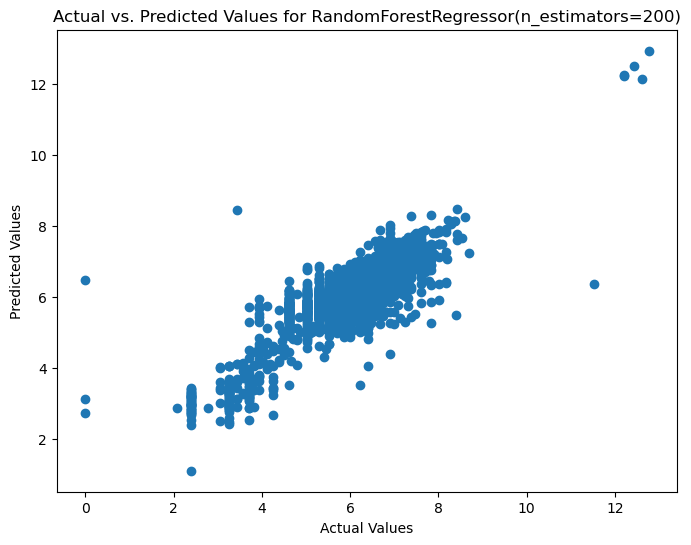

In [193]:
# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=59)

# A list of regression models to evaluate for regression
models = [
    ('Linear Regression', LinearRegression()),
    ('Ridge Regression', Ridge(alpha=1.0)),
    ('Lasso Regression', Lasso(alpha=1.0)),
    ('Random Forest Regressor', RandomForestRegressor(n_estimators=200)),
    ('SVR', SVR(kernel='linear')),
    ('Decision Tree Regressor', DecisionTreeRegressor())
]

# Initialize variables to keep track of the best model and its performance
best_model = None
best_score = -np.inf

# Iterate through the models, fit them, and evaluate their performance
for model_name, model in models:
    model.fit(X_train, Y_train)
    y_pred = model.predict(X_test)
    
    # Calculate metrics (you can add more if needed)
    mse = mean_squared_error(Y_test, y_pred)
    r2 = r2_score(Y_test, y_pred)
    
    print(f'Model: {model_name}')
    print(f'Mean Squared Error: {mse}')
    print(f'R-squared (R2): {r2}')
    
    # Check if this model has the best performance so far
    if r2 > best_score:
        best_score = r2
        best_model = model_name

# Print the best model
print(f'Best Model: {best_model} with R-squared (R2) score of {best_score}')

# We can visualize the actual vs. predicted values for the best model
best_model_index = [model[0] for model in models].index(best_model)
best_model = models[best_model_index][1]
y_pred_best = best_model.predict(X_test)

plt.figure(figsize=(8, 6))
plt.scatter(Y_test, y_pred_best)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title(f"Actual vs. Predicted Values for {best_model}")
plt.show()


Hyper parameter tunning for Random Forest Regressor .

In [194]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

# Create a Random Forest Regressor
rf_regressor = RandomForestRegressor(random_state=39)

# Define a random grid of hyperparameters to search
param_dist = {
    'n_estimators': np.arange(100, 1001, 100),  # Number of trees in the forest
    'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider for the best split
    'max_depth': np.arange(10, 101, 10),  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],  # Minimum samples required at a leaf node
    'bootstrap': [True, False]  # Whether to bootstrap samples
}


In [195]:
# Create the RandomizedSearchCV object with cross-validation
random_search = RandomizedSearchCV(
    rf_regressor, param_distributions=param_dist, n_iter=100, cv=5, scoring='neg_mean_squared_error', random_state=59, n_jobs=-1)

# Fit the model to the data
random_search.fit(X_train, Y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=39),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100]),
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': array([ 100,  200,  300,  400,  500,  600,  700,  800,  900, 1000])},
                   random_state=42, scoring='neg_mean_squared_error')

In [196]:
# Get the best hyperparameters
best_params = random_search.best_params_
print("Best Hyperparameters:", best_params)

# Use the best model for predictions
best_regressor = random_search.best_estimator_
Y_pred = best_regressor.predict(X_test)

# Evaluate the model's performance
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(Y_test, Y_pred)
print("Mean Squared Error:", mse)

Best Hyperparameters: {'n_estimators': 800, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 40, 'bootstrap': True}
Mean Squared Error: 0.28715697144445873


Cross Validation

In [201]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(best_regressor, X, Y, cv = 5)
print('Cross Validation Score :')
print("Score :" ,score)
print("Mean Score :",score.mean())
print("Std deviation :",score.std())

Cross Validation Score :
Score : [0.00946791 0.42962949 0.46515197 0.52890978 0.05343503]
Mean Score : 0.29731883597534114
Std deviation : 0.21983898435448246


Saving model

In [198]:
import joblib
joblib.dump(best_regressor,'Zomato Restaurant Average Cost for two .pkl')

['Zomato Restaurant Average Cost for two .pkl']

Predicting the Final Model

In [200]:
actual_Average_Cost= Y_test

# Make predictions for the selected data points
Pre_Average_Cost = best_regressor.predict(X_test)

# Apply antilog transformation to the predictions
actual_Average_Cost = np.exp(Y_test)
predicted_Average_Cost = np.exp(Pre_Average_Cost)

# Create a DataFrame to display the results
result_df = pd.DataFrame({
    'Actual Average_Cost': actual_Average_Cost,
    'Predicted Average_Cost': predicted_Average_Cost
})

result_df.head(10)

,Actual Average_Cost,Predicted Average_Cost
5390,251.0,315.932015
8893,851.0,518.765315
3370,251.0,347.451765
9266,601.0,575.812736
1306,651.0,377.639125
4530,451.0,498.353810
9269,601.0,729.448009
6556,351.0,295.884516
6826,1001.0,470.455564
6309,201.0,375.102541


We can see that model prediction is good. It can predicte the Average Cost for two column.

For 'Price range' as labeled column 

In [202]:
# Try reading the file with different encodings
encodings_to_try = ['utf-8', 'ISO-8859-1', 'cp1252']

for encoding in encodings_to_try:
    try:
        df1 = pd.read_csv(r'C:\Users\ganes\Downloads\dataset4-main\zomato.csv', encoding=encoding)
        break  # If successful, break the loop
    except UnicodeDecodeError:
        continue

df2= pd.read_excel(r"C:\Users\ganes\Downloads\dataset4-main\Country-Code.xlsx")
df = df1.merge(df2, on='Country Code', how='inner')

In [203]:
df['Cuisines'].fillna('Unknown', inplace=True)
df.drop(columns=['Switch to order menu','Restaurant ID','Restaurant Name','Address','Locality','Locality Verbose','Cuisines'], inplace=True)

In [204]:
from sklearn.cluster import KMeans
# Extract the longitude and latitude data
data = df[['Longitude', 'Latitude']]

# Create a K-Means model with the desired number of clusters
kmeans = KMeans(n_clusters=5, random_state=39)

# Fit the model to your data
kmeans.fit(data)
# Get the cluster assignments for each data point
cluster_labels = kmeans.labels_

# Add the cluster labels to the dataframe
df['Cluster'] = cluster_labels

In [205]:
df['Average Cost for two'] = np.log1p(df['Average Cost for two'])
df['Votes'] = np.log1p(df['Votes'])

skewness = df.skew()
print("Skewness of Columns:")
print(skewness)

Skewness of Columns:
Country Code            3.043965
Longitude              -2.807328
Latitude               -3.081635
Average Cost for two   -0.611041
Price range             0.889618
Aggregate rating       -0.954130
Votes                  -0.029507
Cluster                 3.233231
dtype: float64


In [206]:
import category_encoders as ce

# Specify the columns to encode
columns_to_encode = [ 'City','Currency', 'Rating color', 'Rating text', 'Country']

# Create a BinaryEncoder instance
encoder = ce.BinaryEncoder(cols=columns_to_encode)

# Fit and transform the encoder on your DataFrame
df = encoder.fit_transform(df)
# Use the pandas get_dummies function to perform one-hot encoding
df = pd.get_dummies(df, columns=['Has Table booking', 'Has Online delivery', 'Is delivering now'])

In [207]:
import statsmodels.api as sm

# Our features, excluding the labeled column ( 'Price range')
X = df.drop(columns=['Price range'])

# Add a constant to the features (intercept)
X = sm.add_constant(X)

# Initialize a flag to keep track of whether there are high VIF values
high_vif = True

# Specify the threshold VIF value for removal
vif_threshold = 15

while high_vif:
    # Calculate the VIF for all features
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    # Find the variable with the highest VIF
    max_vif = vif["VIF"].max()
    max_vif_variable = vif.loc[vif["VIF"].idxmax()]["Variable"]

    if max_vif > vif_threshold:
        # Remove the variable with the highest VIF
        X = X.drop(columns=[max_vif_variable])
    else:
        # If all VIF values are below the threshold, set the flag to False
        high_vif = False

# Display the remaining variables
remaining_features = X.columns
print("Remaining Features:")
print(remaining_features)


Remaining Features:
Index(['City_3', 'City_5', 'City_7', 'Longitude', 'Currency_0', 'Currency_2',
       'Rating text_0', 'Rating text_1', 'Rating text_2', 'Votes', 'Country_1',
       'Country_2', 'Country_3', 'Cluster', 'Has Table booking_Yes',
       'Has Online delivery_Yes', 'Is delivering now_Yes'],
      dtype='object')


In [208]:
from sklearn.preprocessing import StandardScaler

# Split the data into features (X) and target (y)
Y = df['Price range']

# Normalize the feature columns using StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

5.Model Development

In [209]:
#Importing Machine learning Model library
from sklearn.svm  import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier , AdaBoostClassifier , BaggingClassifier
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score,f1_score,roc_curve

Splitting Data into train test

In [210]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.30, random_state=39)

Classification Algorithms

Logistics Regression

In [211]:
log_reg=LogisticRegression()
log_reg.fit(X_train,Y_train)
y_pred=log_reg.predict(X_test)
print('Logistics Regression')
print('Accuracy Score :', accuracy_score(Y_test, y_pred))
print('Confusion matrix :',confusion_matrix(Y_test, y_pred))

Logistics Regression
Accuracy Score : 0.6231681786461968
Confusion matrix : [[1086  211   12    1]
 [ 399  434   83    8]
 [  41  141  247   11]
 [  10   33  130   19]]


Decision Tree Classifier

In [212]:
DTC=DecisionTreeClassifier()
DTC.fit(X_train,Y_train)
y_pred=DTC.predict(X_test)
print('Decision Tree Classifier')
print('Accuracy Score :', accuracy_score(Y_test, y_pred))

Decision Tree Classifier
Accuracy Score : 0.557920446615492


Random Forest Classifier

In [213]:
RFC=RandomForestClassifier()
RFC.fit(X_train,Y_train)
y_pred=RFC.predict(X_test)
print('Random Forest Classifier')
print('Accuracy Score :', accuracy_score(Y_test, y_pred))
Accu = accuracy_score(Y_test, y_pred)

Random Forest Classifier
Accuracy Score : 0.592463363572924


AdaBoost Classifier

In [214]:
Abc=AdaBoostClassifier()
Abc.fit(X_train,Y_train)
y_pred=Abc.predict(X_test)
print('AdaBoost Classifier')
print('Accuracy Score :', accuracy_score(Y_test, y_pred))

AdaBoost Classifier
Accuracy Score : 0.6050244242847174


Support Vector Machine Classifier

In [215]:
svc= SVC()
svc.fit(X_train,Y_train)
y_pred = svc.predict(X_test)
print('Support Vector Machine Classifier')
print('Accuracy Score :', accuracy_score(Y_test, y_pred))

Support Vector Machine Classifier
Accuracy Score : 0.6182833217027216


Bagging Classifier

In [89]:
BC= BaggingClassifier()
BC.fit(X_train,Y_train)
y_pred = BC.predict(X_test)
print('Bagging Classifier')
print('Accuracy Score :', accuracy_score(Y_test, y_pred))
Accub = accuracy_score(Y_test, y_pred)

Bagging Classifier
Accuracy Score : 0.5743196092114445


Cross Validation Score

In [91]:
from sklearn.model_selection import cross_val_score

In [216]:
# cross validation score for Logistics Regression
# By default CV=5 and Scoring parameter is accuracy 

score= cross_val_score(log_reg,X,Y)
print(score)
print(score.mean())
print('Difference between accuracy score and cross validation score is -', Accu-score.mean() )

[0.34903192 0.6052356  0.64764398 0.61308901 0.5895288 ]
0.560905860531889
Difference between accuracy score and cross validation score is - 0.031557503041034995


In [217]:
# cross validation score for random forest classifier
score= cross_val_score(RFC,X,Y)
print(score)
print(score.mean())
print('Difference between accuracy score and cross validation score is -', Accu-score.mean() )

[0.30926217 0.4513089  0.52565445 0.55183246 0.47277487]
0.4621665694066592
Difference between accuracy score and cross validation score is - 0.13029679416626477


In [218]:
# cross validation score for Bagging Classifier
score= cross_val_score(BC,X,Y)
print(score)
print(score.mean())
print('Difference between accuracy score and cross validation score is -',Accub-score.mean() )

[0.27786499 0.45602094 0.50942408 0.55968586 0.47068063]
0.45473530209506274
Difference between accuracy score and cross validation score is - 0.1195843071163818


In [219]:
# cross validation score for AdaBoost Classifier
score= cross_val_score(Abc,X,Y)
print(score)
print(score.mean())
print('Difference between accuracy score and cross validation score is -',Accub-score.mean() )

[0.36473051 0.57958115 0.63298429 0.59895288 0.61465969]
0.558181703611771
Difference between accuracy score and cross validation score is - 0.01613790559967354


In [220]:
# cross validation score for Support Vector Machine Classifier
score= cross_val_score(svc,X,Y)
print(score)
print(score.mean())
print('Difference between accuracy score and cross validation score is -',Accub-score.mean() )

[0.33333333 0.51937173 0.64712042 0.62513089 0.26963351]
0.4789179755671902
Difference between accuracy score and cross validation score is - 0.09540163364425436


So our best model is Logistics Regression which have less difference between accuracy score and cross validation score.And higest accuracy score.

5.2 Hyperparameter tuning and Performance of model

In [221]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Define the hyperparameters and their possible values to search
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization parameter
    'penalty': ['l1', 'l2'],  # Regularization type
    'solver': ['liblinear'],  # Solver for logistic regression
}


In [222]:
# Create a Logistic Regression model
logistic_reg = LogisticRegression()

# Create a Grid Search Cross-Validation object
grid_search = GridSearchCV(estimator=logistic_reg, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the Grid Search to your training data
grid_search.fit(X_train, Y_train)


GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'penalty': ['l1', 'l2'], 'solver': ['liblinear']},
             scoring='accuracy')

In [223]:
# Print the best hyperparameters and the corresponding accuracy score
print("Best Hyperparameters: ", grid_search.best_params_)
print("Best Accuracy Score: ", grid_search.best_score_)

# Get the best model with the best hyperparameters
best_logistic_reg = grid_search.best_estimator_

# Evaluate the best model on the test set
accuracy = best_logistic_reg.score(X_test, Y_test)
print("Test Set Accuracy: ", accuracy)

Best Hyperparameters:  {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
Best Accuracy Score:  0.6181002243829469
Test Set Accuracy:  0.6200279134682485


Final Model

In [224]:
best_hyperparameters = grid_search.best_params_

In [225]:
Final_model = LogisticRegression(**best_hyperparameters, random_state=59)
Final_model.fit(X_train,Y_train)
y_pred=Final_model.predict(X_test)
print('Final Model Logistic Regression')
print('Accuracy Score :', accuracy_score(Y_test, y_pred))
print('Confusion matrix :',confusion_matrix(Y_test, y_pred))
print('classification Report :',classification_report(Y_test, y_pred))

Final Model Logistic Regression
Accuracy Score : 0.6200279134682485
Confusion matrix : [[1102  203    4    1]
 [ 420  408   88    8]
 [  54  135  244    7]
 [  18   30  121   23]]
classification Report :               precision    recall  f1-score   support

           1       0.69      0.84      0.76      1310
           2       0.53      0.44      0.48       924
           3       0.53      0.55      0.54       440
           4       0.59      0.12      0.20       192

    accuracy                           0.62      2866
   macro avg       0.59      0.49      0.50      2866
weighted avg       0.61      0.62      0.60      2866



5.3 Saving model

In [226]:
import joblib 
joblib.dump(Final_model,'Zomato Restaurant Price range Project .pkl')

['Zomato Restaurant Price range Project .pkl']

5.4 Predicting the Final Model

In [227]:
prediction = Final_model.predict(X_test)

In [228]:
Actual = np.array(Y_test)
df_pred = pd.DataFrame()
df_pred["Predicted Price range"] = prediction
df_pred["Actual Price range"] = Actual
df_pred.head(10)

,Predicted Price range,Actual Price range
0,1,1
1,1,1
2,2,1
3,2,2
4,1,1
5,1,1
6,2,1
7,1,1
8,1,1
9,1,1


We can see that model prediction is good. It can predicte the Price range column.